In [1]:
import os, sys
os.environ["MALLOC_TRIM_THRESHOLD_"] = '0'
import numpy as np
import h5netcdf

import xarray as xr
import xarray.ufuncs as xu
import pandas as pd

from matplotlib import pyplot as plt
import cartopy.crs as ccrs
import cartopy

plt.rc("figure", figsize=(16,4))
plt.rc("font", size=14)
ccrs.PlateCarree()

from dask.distributed import Client, LocalCluster
cluster = LocalCluster(processes=False, n_workers=1, threads_per_worker=4, protocol = 'tcp')
client = Client(cluster)
client

/home/durandy/miniconda3/envs/towel/lib/python3.9/site-packages/distributed/node.py:160: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 48403 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:48403/status,
Dashboard: http://127.0.0.1:48403/status,Workers: 1
Total threads: 4,Total memory: 78.61 GiB
Status: running,Using processes: False
Comm: tcp://127.0.0.1:46615,Workers: 1
Dashboard: http://127.0.0.1:48403/status,Total threads: 4
Started: Just now,Total memory: 78.61 GiB
Comm: tcp://127.0.0.1:40571,Total threads: 4
Dashboard: http://127.0.0.1:37829/status,Memory: 78.61 GiB
Nanny: None,


# Méthodes
### Notation
Içi on regroupe les différentes notation est nom pour le script, ainsi que les formules mathématiques.

##### Décompostion d'un variable
On peut décomposer une variable X de cette façon :
\begin{equation}
X= \overline{x} + x^{*} \\
\text{$\overline{x}$ est la moyenne et $x^{*}$ est l'anomalie.}
\end{equation}

##### Méthode de calcul pour $\overline{x}$
\begin{equation}
\overline{x} = < \overline{x}_{y} >_h \\
\text{$\overline{x}$ est la moyenne, $y$ la période et $h$ le nombre d'harmonique gardée.}
\end{equation}

# Objectifs
Vérifier les données provenues par $x^*$

In [2]:
def isLeapYear (yearN):
    if ((yearN % 4 == 0) and (yearN % 100 != 0)) or (yearN % 400 == 0):
        reponse = True
    else:
        reponse = False
    print(reponse, '\n')
    return reponse

def hour_mean(x):
     return x.groupby('time.hour').mean('time')
    
def hour_sum(x):
     return x.groupby('time.hour').sum('time')
    
def hour_std(x):
     return x.groupby('time.hour').std('time')

In [3]:
indir_smot = '/cnrm/tropics/commun/DATACOMMUN/WAVE/NO_SAVE/DATA/SMOTHED_CLIM/'
indir_brut = '/cnrm/tropics/commun/DATACOMMUN/WAVE/NO_SAVE/DATA/RAW_CLIM/'
indir_anom = '/cnrm/tropics/commun/DATACOMMUN/WAVE/NO_SAVE/DATA/RAW_ANOMALY/TCWV/'
dirResult = '/cnrm/tropics/commun/DATACOMMUN/WAVE/NO_SAVE/DATA/RAW_ANOMALY/TCWV/MEAN/'

output_fig = '/cnrm/tropics/commun/DATACOMMUN/WAVE/RAPPORT/FIGURES/ANOMALY/'

var = 'tcwv'

#########################################
###--- Pour la période 1990 - 2021 ---###
#########################################
## open data
year = np.arange(2012,2014)
datasets = []
for y in year :
    ds = xr.open_mfdataset(indir_anom + '*' + str(y) + '.nc', chunks = {'time' : 1, 'latitude' : 1})
    datasets.append(ds.astype('float16'))

ds_anom = xr.concat(datasets, dim = 'time')
ds_smot = xr.open_mfdataset(indir_smot+'clim_tcwv_smooth_ERA5_3H_1990_2020.nc', chunks = {'time' : 1}, parallel=True)
ds_brut = xr.open_mfdataset(indir_brut+'clim_tcwv_brut_ERA5_3H_1990_2020.nc', chunks = {'time' : 1}, parallel=True)

ds_anom = ds_anom.sel(latitude = slice(40.1,-40.1))
ds_smot = ds_smot.sel(latitude = slice(40.1,-40.1))
ds_brut = ds_brut.sel(latitude = slice(40.1,-40.1))
#####################################################################################

#########################################
###--- Pour la période 2012 - 2016 ---###
#########################################
## open data
datasets = []
year = np.arange(2012,2017)
for y in year :
    ds = xr.open_mfdataset(indir_anom + '*' + str(y) + '*TOUCAN_without_biais.nc', chunks = {'time' : 1, 'latitude' : 1})
    datasets.append(ds.astype('float16'))

ds_anom_p = xr.concat(datasets, dim = 'time')
ds_smot_p = xr.open_mfdataset(indir_smot+'clim_tcwv_smooth_ERA5_3H_2012_2016_3harm_without_biais.nc', chunks = {'time' : 1}, parallel=True)
ds_brut_p = xr.open_mfdataset(indir_brut+'clim_tcwv_brut_ERA5_3H_2012_2016.nc', chunks = {'time' : 1}, parallel=True)

ds_anom_p = ds_anom_p.sel(latitude = slice(40.1,-40.1))
ds_smot_p = ds_smot_p.sel(latitude = slice(40.1,-40.1))
ds_brut_p = ds_brut_p.sel(latitude = slice(40.1,-40.1))
#####################################################################################

In [4]:
ds_mean_anom = xr.open_dataset(indir_anom + 'MEAN/mean_anomaly_tcwv_ERA5_3H_1990_2020.nc', chunks = {'time' : 1})
ds_mean_anom_T = xr.open_dataset(indir_anom + 'MEAN/mean_anomaly_tcwv_ERA5_3H_2012_2016.nc', chunks = {'time' : 1})

# Verification de la climatologie en 1D
## Moyenne des anomalies + climatologie
\begin{equation}
X= \overline{x^{*}} + \overline{x}
\end{equation}

avec $\overline{x}\rightarrow$ ds_smot \\\
et $\overline{x^{*}}\rightarrow$ ds_mean_anom \\\
$X\rightarrow$ ds_tot \\\
X = tcwv

In [5]:
da_tot = ds_mean_anom['tcwv_ano'] + ds_smot['tcwv_smooth']
da_tot_T = ds_mean_anom_T['tcwv_ano'] + ds_smot_p['tcwv_smooth']

##### Sur la période 1990-2020
\begin{equation}
\overline{tcwv} = < \overline{tcwv}_{30} >_3 \\
\end{equation}

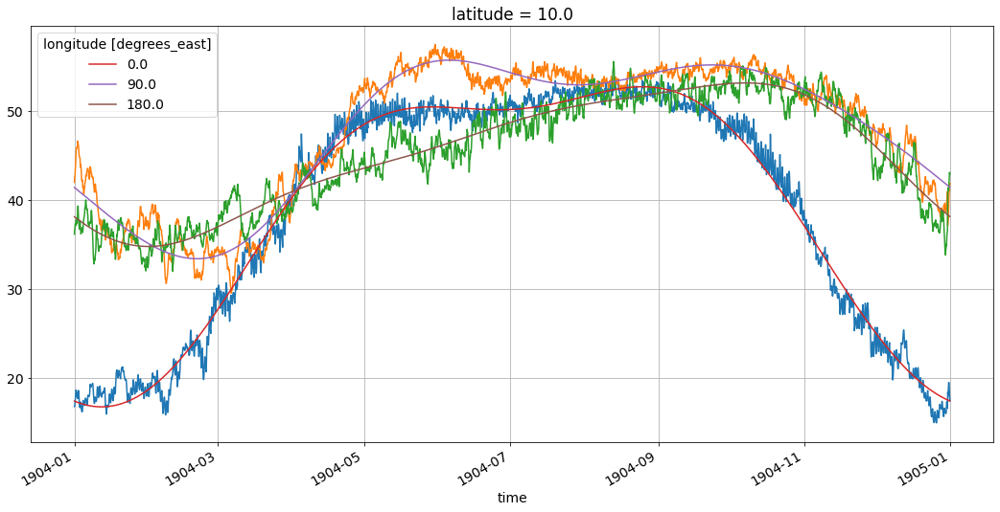

In [6]:
plt.rc("figure", figsize=(18,8))

latitude = 10
longitude = [0, 90, 180]

plt.figure()
ds_brut['tcwv'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
da_tot.sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
# da_tot_T.sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()

 ##### Sur la période 2012-2016
\begin{equation}
\overline{tcwv} = < \overline{tcwv}_{T} >_3 \\
\end{equation}


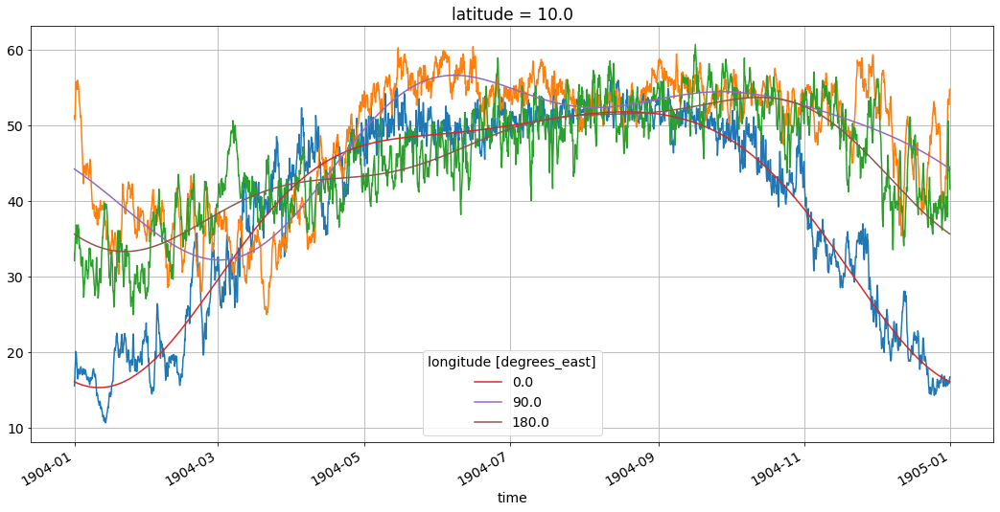

In [7]:
latitude = 10
longitude = [0, 90, 180]

plt.figure()
ds_brut_p['tcwv'].sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
da_tot_T.sel(latitude = latitude, longitude = longitude).plot(hue='longitude')
plt.grid()
# plt.legend()
plt.show()

# Verification de l'anomalie en 2D pour 1990-2010
## Moyennes mensuelle et saisonnière
\begin{equation}
\overline{tcwv^*}_j = \frac{\displaystyle\sum_{i=1}^{n_j}x^{*}_i} {n_j} = \mu^{*}_j\\
\text{$j$ de 1 à 12 ou de 1 à 4, $\mu$ la moyenne mensuelle ou saisonière, n le nombre de pas de temps $n_j = nbAnnee * nbJour_j * \frac{24}{3}$} \\[30pt]
\end{equation}

#### Carte global de l'anomalie de PW en moyenne mensuelle

In [5]:
ds_MMS = xr.open_dataset(dirResult + 'ds_anom_MM.nc', 
                         chunks = {'time' : 1})
ds_MSS = xr.open_dataset(dirResult + 'ds_anom_MS.nc', 
                         chunks = {'time' : 1})

In [5]:
#### Parameter for plotting
plt.rc("figure", figsize=(16,4))

vmax = 2
vmin = -vmax
cmap ='RdBu_r'
size = 5

colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(vmin,vmax+.1,0.2),
            'extend' : 'both'}


map_proj = ccrs.Mercator(central_longitude=0.0, 
                         min_latitude=-40.0, 
                         max_latitude=40.0, 
                         globe=None)

/home/durandy/miniconda3/envs/towel/lib/python3.9/site-packages/xarray/plot/facetgrid.py:394: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout()


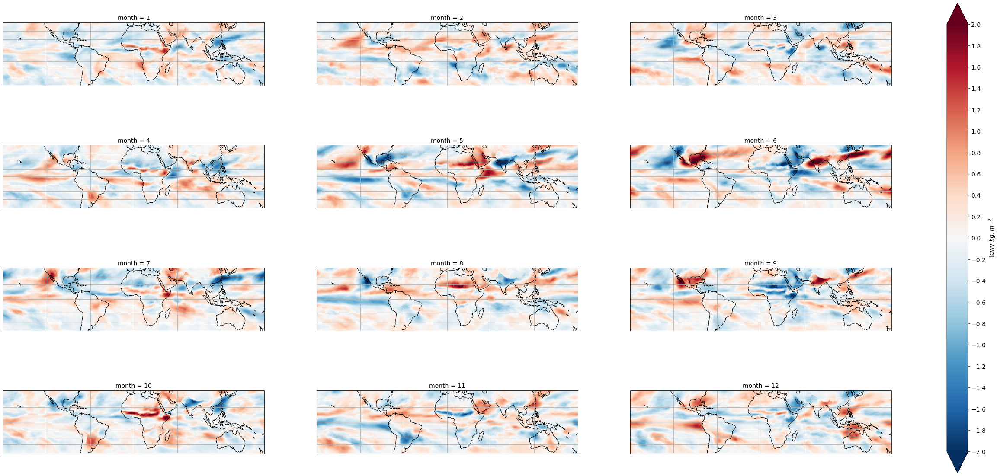

In [7]:
p = ds_MMS['tcwv_ano'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'month', col_wrap =3,
                               aspect = 3, size = size,
                               vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                               cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
    
plt.savefig(output_fig+'atlas_meanMonth_anomaly.png')  

#### Carte global de l'anomalie de PW en moyenne saisonnière

In [10]:
#### Parameter for plotting
vmax = 1.
vmin = -vmax
cmap ='RdBu_r'
size = 5

colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(vmin,vmax+.1,.2),
            'extend' : 'both'}


map_proj = ccrs.Mercator(central_longitude=0.0, 
                         min_latitude=-40.0, 
                         max_latitude=40.0, 
                         globe=None)

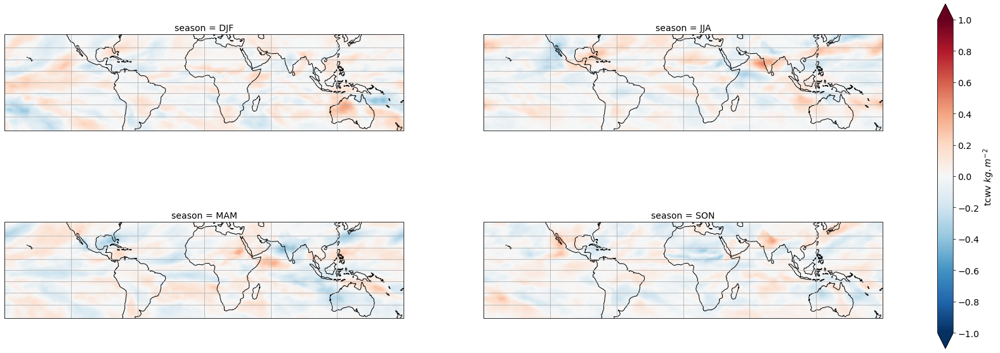

In [11]:
p = ds_MSS['tcwv_ano'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'season', col_wrap =2,
                               aspect = 3, size = size,
                               vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                               cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
    
plt.savefig(output_fig+'atlas_meanSeason_anomaly.png')



## Calcul de l'écart-type pour l'anomalie
\begin{equation}
\sigma = \sqrt{\frac{\displaystyle\sum_{i=1}^{n}(x^*_i - \mu^*_i)^2} {n}} \\
\text{avec n le nombre de pas de temps total,  $\mu$ la moyenne climatologique au pas de temps} \\[30pt]
\sigma_j = \sqrt{\frac{\displaystyle\sum_{i=1}^{n_j}(x^*_i - \mu^*_i)^2} {n_j}} \\
\text{$j$ de 1 à 12 ou de 1 à 4, $\mu_i$ la moyenne climatologique au pas de temps, n le nombre de pas de temps $n_j = nbAnnee * nbJour_j * \frac{24}{3}$}
\end{equation}



In [13]:
# import xarray.ufuncs as xu

# # n
# # test = xr.apply_ufunc(lambda x, m, n: (x - m)**2/n , ds_anom, ds_mean_anom, n)
# ds_anom #- ds_mean_anom
# # ds_mean_anom

# def isLeapYear(yearN):
#     if ((yearN % 4 == 0) and (yearN % 100 != 0)) or (yearN % 400 == 0):
#         reponse = True
#     else:
#         reponse = False
#     return reponse

# def is_jja(month):
#     return (month >= 6) & (month <= 8)

# # seasonal_data = temp_data.sel(time=is_amj(temp_data['time.month']))
# n_j = 0
# _ds_mean_anom = ds_mean_anom.sel(time=is_jja(ds_mean_anom['time.month']))
# subDs = []
# for y in range(1990,2021) :
#     _ds = ds_anom.sel(time = str(y))
#     _ds = _ds.sel(time=is_amj(_ds['time.month']))
# #     if isLeapYear(_ds.time.dt.year[0].values) == True :
#     _ds_mean_anom['time'] = _ds.time
#     _dsSub = (_ds - _ds_mean_anom)**2
#     n_j = n_j + len(_dsSub.time.values)

        
# #     else :
# #         _ds_mean_anom = ds_mean_anom.isel(time = slice(None,-int(24/3)))
# #         _ds_mean_anom['time'] = _ds.time
# #         _dsSub = xu.square(_ds - _ds_mean_anom )
        
#     subDs.append(_dsSub)
# dsSub = xr.concat(subDs, dim='time', coords='minimal', compat='override')
# dsSub = xu.sqrt(dsSub['tcwv_ano'].sum('time')/n_j)
# # dsSub['tcwv_ano'].sum('time')
# dsSub
#ds_std_anom_S.sel(season='JJA')

# fig, axis = plt.subplots(
#     1, 1, subplot_kw={'projection': map_proj})

# ds_std_anom_S['tcwv_ano'].sel(season='JJA').plot.contourf(ax=axis, levels = 101,
#                     transform=ccrs.PlateCarree(),
#                     vmin = 0., vmax = 10, cmap=cmap,# multiplot settings
#                     cbar_kwargs=colorbar)

# # p = dsSub.plot.contourf(ax = None, aspect = 3, size = 3, transform=ccrs.PlateCarree(),
# #                          col_wrap = 1,
# #                                vmin = 0., vmax = vmax, cmap=cmap,# multiplot settings
# #                                subplot_kws={'projection': map_proj},
# #                                cbar_kwargs=colorbar)
# axis.coastlines()
# plt.title("Standard deviation JJA")
# plt.show()

In [12]:
ds_std_anom  = xr.open_dataset(dirResult + 'ds_anom_std_Y.nc', 
                         chunks = {'time' : 1})
ds_std_anom_M = xr.open_dataset(dirResult + 'ds_anom_std_M.nc', 
                         chunks = {'time' : 1})
ds_std_anom_S = xr.open_dataset(dirResult + 'ds_anom_std_S.nc', 
                         chunks = {'time' : 1})

ds_std_anom_JJAS = xr.open_dataset(dirResult + 'ds_anom_STD_JJAS.nc', 
                         chunks = {'time' : 1})

# ds_std_anom = xu.square(ds_std_anom)
# ds_std_anom_M = xu.square(ds_std_anom_M)
# ds_std_anom_S = xu.square(ds_std_anom_S)
# ds_std_anom_JJAS = xu.square(ds_std_anom_JJAS)

In [13]:
vmax = 230**(1/2)
vmin = 0.
cmap ='RdBu'
size = 5
aspect = 4

#### Parameter for plotting
colorbar = {'label': 'tcwv $kg^{2}.m^{-4}$',
            'orientation': 'vertical' ,
            'extend' : 'max'}

map_proj = ccrs.Mercator(central_longitude=0.0, 
                         min_latitude=-40.0, 
                         max_latitude=40.0, 
                         globe=None)

#### Atlas de l'écart-type sur les douze mois 

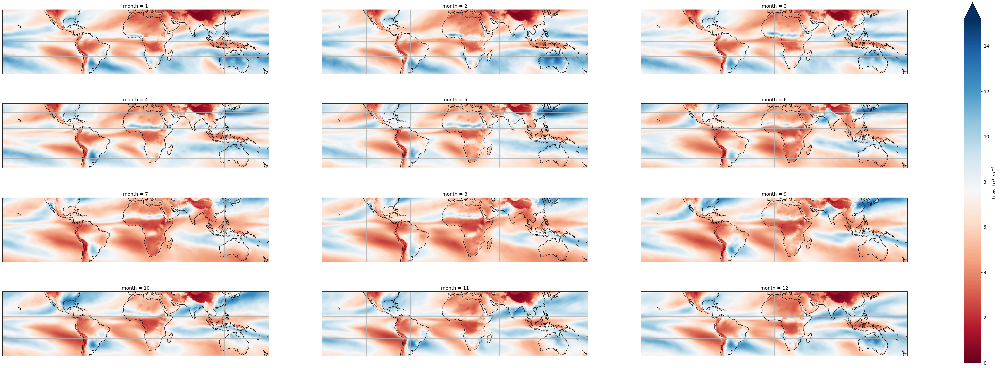

In [14]:
p = ds_std_anom_M['tcwv_ano'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'month', col_wrap =3,
                               aspect = aspect, size = size,
                               vmin = 0., vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                               cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
    
# plt.show()
plt.savefig(output_fig+'atlas_varMonth_anomaly.png')

#### Atlas de l'écart type saisonière

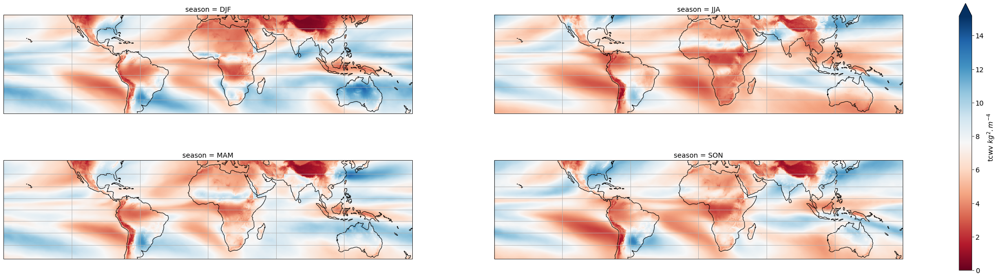

In [15]:
p = ds_std_anom_S['tcwv_ano'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'season', col_wrap =2,
                               aspect = aspect, size = size,
                               vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                              cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
plt.savefig(output_fig+'atlas_varSeason_anomaly.png')

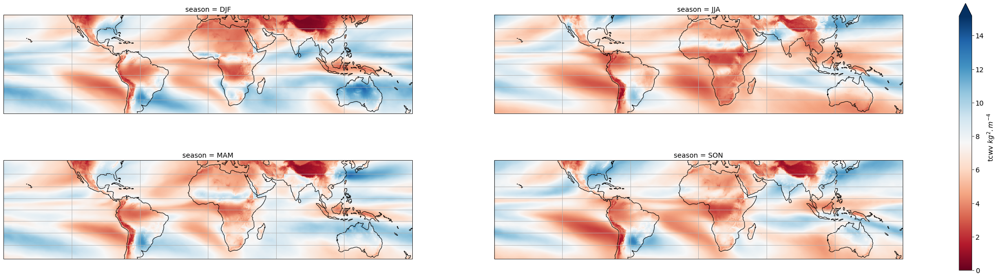

In [16]:
p = ds_std_anom_S['tcwv_ano'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'season', col_wrap =2,
                               aspect = aspect, size = size,
                               vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                              cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
plt.savefig(output_fig+'atlas_varSeason_anomaly.png')

#### Atlas de l'écart-type

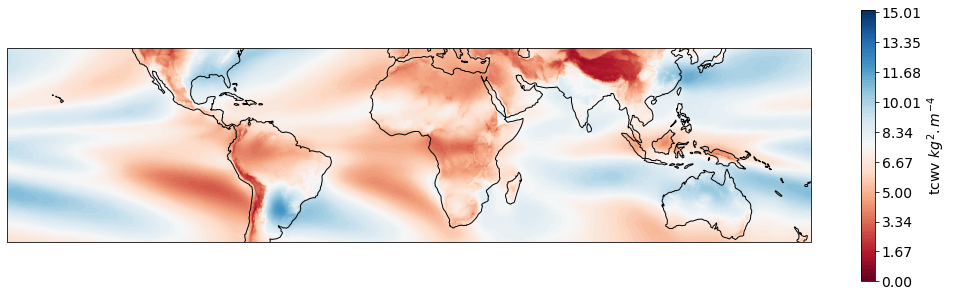

In [17]:
plt.rc("figure", figsize=(18,5))

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_std_anom['tcwv_ano'].plot.contourf(ax=axis, levels = 101,
                    transform=ccrs.PlateCarree(),
                    vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                    cbar_kwargs=colorbar)

axis.coastlines()
plt.savefig(output_fig+'atlas_varYear_anomaly.png')

## Par rapport à Poan

In [20]:
ds_std_anom_JJAS = xr.open_dataset(dirResult + 'ds_anom_STD_JJAS.nc', 
                         chunks = {'time' : 1})

ds_std_anom_JJAS = xu.square(ds_std_anom_JJAS)
ds_std_anom_JJAS = ds_std_anom_JJAS.drop_sel(longitude=np.arange(40,320,0.25))
ds_std_anom_JJAS

<xarray.Dataset>
Dimensions:    (longitude: 320, latitude: 321)
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * latitude   (latitude) float32 40.0 39.75 39.5 39.25 ... -39.5 -39.75 -40.0
Data variables:
    tcwv       (latitude, longitude) float32 dask.array<chunksize=(321, 320), meta=np.ndarray>

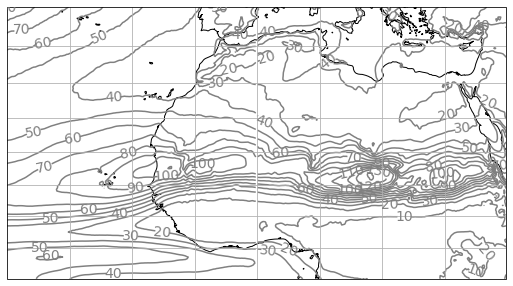

<Figure size 1296x360 with 0 Axes>

In [21]:
map_proj = ccrs.Mercator(central_longitude=0.0, 
                         min_latitude=0.0, 
                         max_latitude=40.0,
                         globe=None)



fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

cs = ds_std_anom_JJAS['tcwv'].plot.contour(ax=axis, levels = np.arange(0,141,10),
                    transform=ccrs.PlateCarree(),
                    colors = 'grey'# multiplot settings
                    )

axis.coastlines()
axis.clabel(cs, fmt='%1.0f')
axis.grid()
axis.gridlines()
plt.show()
plt.savefig(output_fig+'atlas_varJJAS_anomaly.png')

# Verification de l'anomalie en 2D pour TOUCAN
## Moyennes mensuelle et saisonnière
\begin{equation}
\overline{tcwv}_j = \frac{\displaystyle\sum_{i=1}^{n_j}x_i} {n_j} = \mu_j\\
\text{$j$ de 1 à 12 ou de 1 à 4, $\mu$ la moyenne mensuelle ou saisonière, n le nombre de pas de temps $n_j = nbAnnee * nbJour_j * \frac{24}{3}$} \\[30pt]
\end{equation}


In [22]:
ds_MMS = xr.open_dataset(dirResult + 'ds_anom_MM_TOUCAN.nc', 
                         chunks = {'time' : 1}).compute()
ds_MSS = xr.open_dataset(dirResult + 'ds_anom_MS_TOUCAN.nc', 
                         chunks = {'time' : 1}).compute()


#### Carte global de l'anomalie de PW en moyenne mensuelle

In [23]:
#### Parameter for plotting
vmax = 5.
vmin = -5.
cmap ='RdBu_r'
size = 5

colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(vmin,vmax+.1,2),
            'extend' : 'both'}


map_proj = ccrs.Mercator(central_longitude=0.0, 
                         min_latitude=-40.0, 
                         max_latitude=40.0, 
                         globe=None)

/home/durandy/miniconda3/envs/towel/lib/python3.9/site-packages/xarray/plot/facetgrid.py:394: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout()


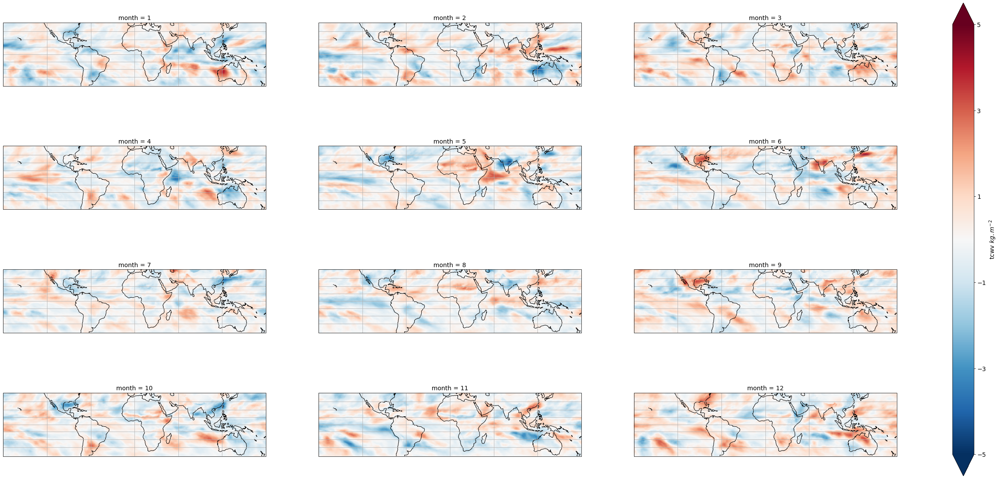

In [24]:
p = ds_MMS['tcwv_ano'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'month', col_wrap =3,
                               aspect = 3, size = size,
                               vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                               cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
    
plt.savefig(output_fig+'atlas_meanMonth_anomaly_TOUCAN.png')  

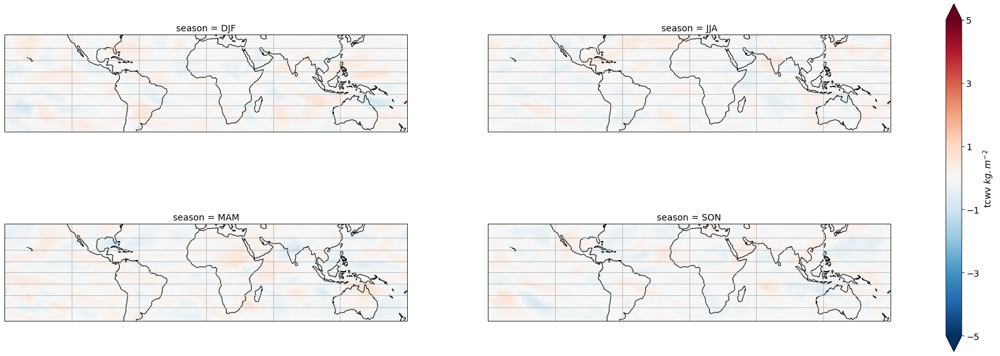

In [25]:
p = ds_MSS['tcwv_ano'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'season', col_wrap =2,
                               aspect = 3, size = size,
                               vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                               cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
    
plt.savefig(output_fig+'atlas_meanSeason_anomaly_TOUCAN.png')

## Calcul de la variance pour l'anomalie
\begin{equation}
\sigma^2_j = \frac{\displaystyle\sum_{i=1}^{n_j}(x_i - \mu_i)^2} {n_j} \\
\text{$j$ de 1 à 12 ou de 1 à 4, $\mu_i$ la moyenne au pas de temps, n le nombre de pas de temps $n_j = nbAnnee * nbJour_j * \frac{24}{3}$}
\end{equation}

In [26]:
ds_std_anom  = xr.open_dataset(dirResult + 'ds_anom_std_Y_TOUCAN.nc', 
                         chunks = {'time' : 1}).compute()
ds_std_anom_M = xr.open_dataset(dirResult + 'ds_anom_std_M_TOUCAN.nc', 
                         chunks = {'time' : 1}).compute()
ds_std_anom_S= xr.open_dataset(dirResult + 'ds_anom_std_S_TOUCAN.nc', 
                         chunks = {'time' : 1}).compute()

In [4]:
vmax = 10.
vmin = 0.
cmap ='RdBu'
size = 5

#### Parameter for plotting
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(vmin,vmax+0.1,0.5),
            'extend' : 'max'}


#### Atlas de la variance sur les douze mois 

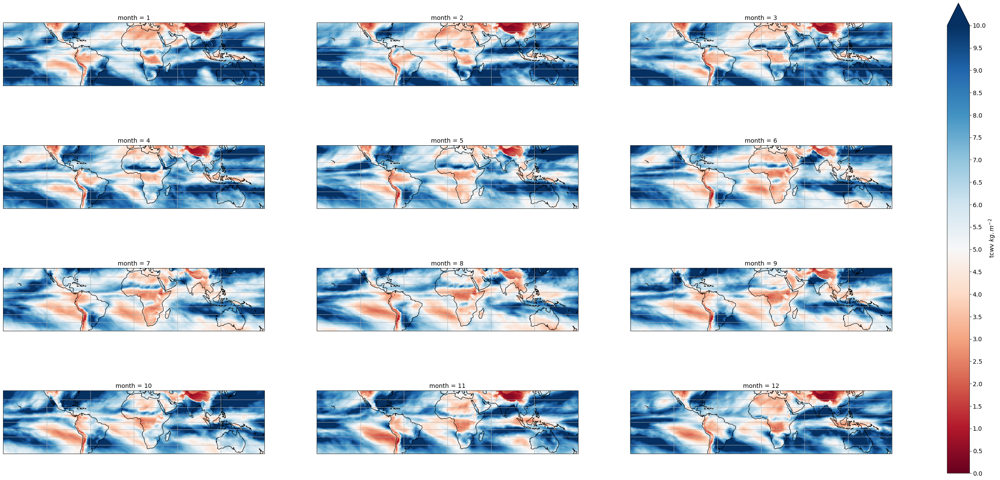

In [28]:
p = ds_std_anom_M['tcwv_ano'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'month', col_wrap =3,
                               aspect = 3, size = size,
                               vmin = 0., vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                               cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
    
# plt.show()
plt.savefig(output_fig+'atlas_varMonth_anomaly_TOUCAN.png')

#### Atlas de la variance saisonière

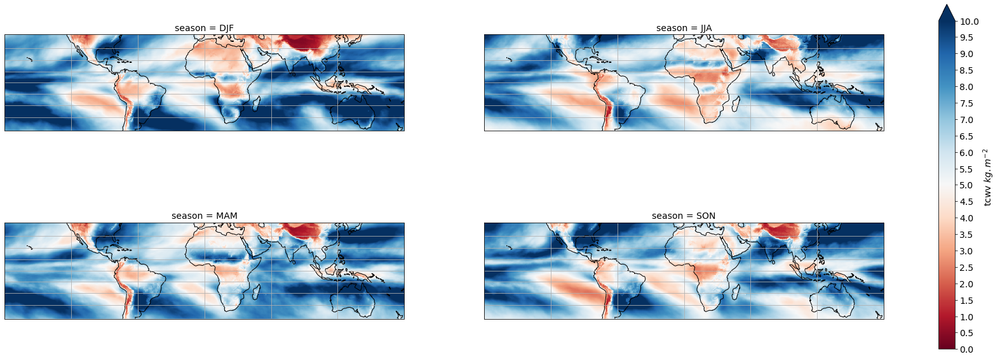

In [29]:
p = ds_std_anom_S['tcwv_ano'].plot(transform=ccrs.PlateCarree(),  # the data's projection
                               col = 'season', col_wrap =2,
                               aspect = 3, size = size,
                               vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                               subplot_kws={'projection': map_proj},
                              cbar_kwargs=colorbar)
for ax in p.axes.flat:
    ax.coastlines()
    ax.gridlines()
plt.savefig(output_fig+'atlas_varSeason_anomaly_TOUCAN.png')

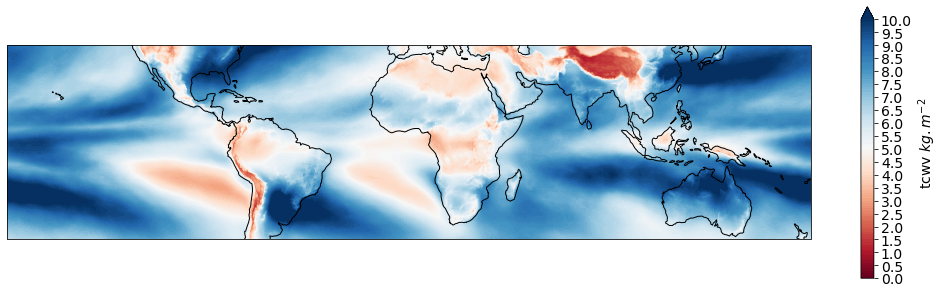

In [30]:
fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_std_anom['tcwv_ano'].plot.contourf(ax=axis, levels = 101,
                    transform=ccrs.PlateCarree(),
                    vmin = vmin, vmax = vmax, cmap=cmap,# multiplot settings
                    cbar_kwargs=colorbar)

axis.coastlines()
plt.savefig(output_fig+'atlas_varYear_anomaly_TOUCAN.png')

# Quantile de l'anomalie avec la climatalogie de TOUCAN pour la période 2012-2016

In [ ]:
# ds_anom_T = ds_anom_T.chunk(dict(time=-1, longitude=8))
# _ds_anom_p = ds_anom_p.isel(time = slice(0,None,4))
# _ds_anom_p = _ds_anom_p.astype('float16')
_ds_anom = ds_anom.astype('float16')
_ds_anom = _ds_anom.isel(time = slice(0,None,4))

# _ds_anom_p = ds_anom_p.isel(time = slice(0,None,8))

# ds_quan_TOUCAN = _ds_anom_p.chunk(dict(time=-1, latitude = 1)).quantile([0.01, 0.1, 0.25, 0.5, 0.75, 0.9, 0.99], dim = 'time')
ds_quan = _ds_anom.chunk(dict(time=-1, latitude = 1)).quantile([0.01, 0.1, 0.25, 0.5, 0.75, 0.9, 0.99], dim = 'time')
# ds_quan_TOUCAN = ds_quan_TOUCAN.load()
ds_quan = ds_quan.load()

distributed.utils_perf - WARNING - full garbage collections took 16% CPU time recently (threshold: 10%)


In [ ]:
map_proj = ccrs.Mercator(central_longitude=0.0, 
                         min_latitude=-40.0, 
                         max_latitude=40.0, 
                         globe=None)


In [ ]:
plt.rc("figure", figsize=(16,4))
cmap ='RdBu'

#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' ,
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_TOUCAN['tcwv_ano'].sel(quantile = 0.01).plot.contourf(ax=axis, levels = 101, vmax = 0., 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap ,
                    cbar_kwargs=colorbar)

axis.coastlines()
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(-16,0+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_TOUCAN['tcwv_ano'].sel(quantile = 0.1).plot.contourf(ax=axis, levels = 101, vmax = 0., vmin = -16.1,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap ,
                    cbar_kwargs=colorbar)

axis.coastlines()
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(-10,0+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_TOUCAN['tcwv_ano'].sel(quantile = 0.25).plot.contourf(ax=axis, levels = 101, vmax = 0., vmin = -10.1,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' ,
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_TOUCAN['tcwv_ano'].sel(quantile = 0.5).plot.contourf(ax=axis, levels = 101,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#######################################################################################
cmap ='RdBu_r'
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(0,10+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_TOUCAN['tcwv_ano'].sel(quantile = 0.75).plot.contourf(ax=axis, levels = 101, vmin = 0., vmax = 10.1,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
##########################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(0,16+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_TOUCAN['tcwv_ano'].sel(quantile = 0.9).plot.contourf(ax=axis, levels = 101, vmin = 0., vmax = 16.1,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
##########################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_TOUCAN['tcwv_ano'].sel(quantile = 0.99).plot.contourf(ax=axis, levels = 101, vmin = 0., 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
plt.savefig(output_fig+'Quantile_2012_2016_T.png')

# Quantile de l'anomalie avec la climatalogie sur 30 ans pour la période 1990-2020

In [ ]:
plt.rc("figure", figsize=(16,4))
cmap ='veridis'
vmin, vmax = -15 , 15

#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' ,
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.01).plot.contourf(ax=axis, levels = 101, vmax = 0.,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap ,
                    cbar_kwargs=colorbar)

axis.coastlines()
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(-16,0+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.1).plot.contourf(ax=axis, levels = 101, vmax = 0., vmin = -16.1,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap ,
                    cbar_kwargs=colorbar)

axis.coastlines()
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(-10,0+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.25).plot.contourf(ax=axis, levels = 101, vmax = 0., vmin = -10.1,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.5).plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#######################################################################################
cmap ='RdBu_r'
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(0,10+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.75).plot.contourf(ax=axis, levels = 101, vmin = 0., vmax = 10.1,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
##########################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(0,16+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.9).plot.contourf(ax=axis, levels = 101, vmin = 0., vmax = 16.1,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
##########################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.99).plot.contourf(ax=axis, levels = 101, vmin = vmin, vmax = vmax, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
# plt.savefig(output_fig+'atlas_varYear_anomaly_TOUCAN.png')

# Quantile de l'anomalie avec la climatalogie sur 30 ans pour la période 2012-2016

In [ ]:
_ds_anom = ds_anom.sel(time = slice('2012','2016'))
_ds_anom = _ds_anom.astype('float16')
ds_quan = _ds_anom.chunk(dict(time=-1, latitude = 1)).quantile([0.01, 0.1, 0.25, 0.5, 0.75, 0.9, 0.99], dim = 'time')


In [ ]:
plt.rc("figure", figsize=(16,4))
cmap ='RdBu'

#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.01).plot.contourf(ax=axis, levels = 101, vmax = 0., 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap ,
                    cbar_kwargs=colorbar)

axis.coastlines()
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(-16,0+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.1).plot.contourf(ax=axis, levels = 101, vmax = 0., 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap ,
                    cbar_kwargs=colorbar)

axis.coastlines()
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(-10,0+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.25).plot.contourf(ax=axis, levels = 101, vmax = 0., vmin = -10.1,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.5).plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
#######################################################################################
cmap ='RdBu_r'
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(0,10+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.75).plot.contourf(ax=axis, levels = 101, vmin = 0., vmax = 10.1,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
##########################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 'ticks': np.arange(0,16+0.1,1),
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.9).plot.contourf(ax=axis, levels = 101, vmin = 0., vmax = 16.,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
##########################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan['tcwv_ano'].sel(quantile = 0.99).plot.contourf(ax=axis, levels = 101, vmin = 0.,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.show()
plt.savefig(output_fig+'quantile_2012_2016_30a.png')

In [ ]:
#Computation of the difference between quantile
diff = ds_quan - ds_quan_TOUCAN

In [ ]:

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

diff['tcwv_ano'].sel(quantile = 0.1).plot.contourf(ax=axis, levels = 101,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap) #,# multiplot settings
                    # cbar_kwargs=colorbar)

axis.coastlines()
plt.show()
#####################################################################################
fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

diff['tcwv_ano'].sel(quantile = 0.25).plot.contourf(ax=axis, levels = 101,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap) #,# multiplot settings
                    # cbar_kwargs=colorbar)

axis.coastlines()
plt.show()
#######################################################################################
fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

diff['tcwv_ano'].sel(quantile = 0.75).plot.contourf(ax=axis, levels = 101,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap) #,# multiplot settings
                    # cbar_kwargs=colorbar)

axis.coastlines()
plt.show()
##########################################################################################
fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

diff['tcwv_ano'].sel(quantile = 0.9).plot.contourf(ax=axis, levels = 101,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap) #,# multiplot settings
                    # cbar_kwargs=colorbar)

axis.coastlines()
plt.show()

# Ecart Inter-quantile
## Pour la climatologie sur 30 ans

In [ ]:
ds_quan_diff_9_1 = ds_quan.sel(quantile = 0.9) - ds_quan.sel(quantile = 0.1)
ds_quan_diff_99_11 = ds_quan.sel(quantile = 0.99) - ds_quan.sel(quantile = 0.01)
ds_quan_diff_9_5 = ds_quan.sel(quantile = 0.9) - ds_quan.sel(quantile = 0.5)
ds_quan_diff_5_1 = ds_quan.sel(quantile = 0.5) - ds_quan.sel(quantile = 0.1)
ds_quan_diff_75_25 = ds_quan.sel(quantile = 0.75) - ds_quan.sel(quantile = 0.25)

In [ ]:
plt.rc("figure", figsize=(16,4))
cmap ='RdBu_r'

#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_diff_9_1['tcwv_ano'].plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap ,
                    cbar_kwargs=colorbar)

axis.coastlines()
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.title("difference inter-quantile 0.90 - 0.10")
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_diff_99_11['tcwv_ano'].plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap ,
                    cbar_kwargs=colorbar)

axis.coastlines()
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.title("difference inter-quantile 0.99 - 0.01")
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_diff_9_5['tcwv_ano'].plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.title("difference inter-quantile 0.90 - 0.50")
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_diff_5_1['tcwv_ano'].plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.title("difference inter-quantile 0.50 - 0.10")
plt.show()
#######################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_diff_75_25['tcwv_ano'].plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.title("difference inter-quantile 0.75 - 0.25")
plt.show()

## Pour la climatologie sur TOOCAN

In [ ]:
ds_quan_diff_9_1_T = ds_quan_TOUCAN.sel(quantile = 0.9) - ds_quan_TOUCAN.sel(quantile = 0.1)
ds_quan_diff_99_11_T = ds_quan_TOUCAN.sel(quantile = 0.99) - ds_quan_TOUCAN.sel(quantile = 0.01)
ds_quan_diff_9_5_T = ds_quan_TOUCAN.sel(quantile = 0.9) - ds_quan_TOUCAN.sel(quantile = 0.5)
ds_quan_diff_5_1_T = ds_quan_TOUCAN.sel(quantile = 0.5) - ds_quan_TOUCAN.sel(quantile = 0.1)
ds_quan_diff_75_25_T = ds_quan_TOUCAN.sel(quantile = 0.75) - ds_quan_TOUCAN.sel(quantile = 0.25)

In [ ]:
plt.rc("figure", figsize=(16,4))
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_diff_9_1_T['tcwv_ano'].plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap ,
                    cbar_kwargs=colorbar)

axis.coastlines()
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.title("difference inter-quantile 0.90 - 0.10")
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_diff_99_11_T['tcwv_ano'].plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap ,
                    cbar_kwargs=colorbar)

axis.coastlines()
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.title("difference inter-quantile 0.99 - 0.01")
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_diff_9_5_T['tcwv_ano'].plot.contourf(ax=axis, levels = 101,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.title("difference inter-quantile 0.9 - 0.5")
plt.show()
#####################################################################################
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_diff_5_1_T['tcwv_ano'].plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.title("difference inter-quantile 0.50 - 0.10")
plt.show()
#######################################################################################
cmap ='RdBu_r'
colorbar = {'label': 'tcwv $kg.m^{-2}$',
            'orientation': 'vertical' , 
            'extend' : 'max'}

fig, axis = plt.subplots(
    1, 1, subplot_kw={'projection': map_proj})

ds_quan_diff_75_25_T['tcwv_ano'].plot.contourf(ax=axis, levels = 101, 
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    cbar_kwargs=colorbar)

axis.coastlines()
axis.gridlines(draw_labels=True)
gl = axis.gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
plt.title("difference inter-quantile 0.75 - 0.25")
plt.show()